# Siren Exploration

This is a colab to explore properties of the Siren MLP, proposed in our work [Implicit Neural Activations with Periodic Activation Functions](https://vsitzmann.github.io/siren).


We will first implement a streamlined version of Siren for fast experimentation. This lacks the code to easily do baseline comparisons - please refer to the main code for that - but will greatly simplify the code!

**Make sure that you have enabled the GPU under Edit -> Notebook Settings!**

We will then reproduce the following results from the paper: 
* [Fitting an image](#section_1)
* [Fitting an audio signal](#section_2)
* [Solving Poisson's equation](#section_3)
* [Initialization scheme & distribution of activations](#activations)
* [Distribution of activations is shift-invariant](#shift_invariance)

We will also explore Siren's [behavior outside of the training range](#out_of_range).

Let's go! First, some imports, and a function to quickly generate coordinate grids.

In [1]:
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import os

from PIL import Image
from torchvision.transforms import Resize, Compose, ToTensor, Normalize
import numpy as np
import skimage
import matplotlib.pyplot as plt

import time

def get_mgrid(sidelen, dim=2):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])
    mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid

# GPU setting

In [2]:
import os

os.environ['CUDA_VISIBLE_DEVICES'] = "3"
device = torch.device('cuda:0')

# SIREN archi.

Now, we code up the sine layer, which will be the basic building block of SIREN. This is a much more concise implementation than the one in the main code, as here, we aren't concerned with the baseline comparisons.

In [3]:
class SineLayer(nn.Module):
    # See paper sec. 3.2, final paragraph, and supplement Sec. 1.5 for discussion of omega_0.
    
    # If is_first=True, omega_0 is a frequency factor which simply multiplies the activations before the 
    # nonlinearity. Different signals may require different omega_0 in the first layer - this is a 
    # hyperparameter.
    
    # If is_first=False, then the weights will be divided by omega_0 so as to keep the magnitude of 
    # activations constant, but boost gradients to the weight matrix (see supplement Sec. 1.5)
    
    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega_0=30):
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first
        
        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        
        self.init_weights()
    
    def init_weights(self):
        with torch.no_grad():
            if self.is_first:
                self.linear.weight.uniform_(-1 / self.in_features, 
                                             1 / self.in_features)      
            else:
                self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.omega_0, 
                                             np.sqrt(6 / self.in_features) / self.omega_0)
        
    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))
    
    def forward_with_intermediate(self, input): 
        # For visualization of activation distributions
        intermediate = self.omega_0 * self.linear(input)
        return torch.sin(intermediate), intermediate
    
    
class Siren(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False, 
                 first_omega_0=30, hidden_omega_0=30.):
        super().__init__()
        
        self.net = []
        self.net.append(SineLayer(in_features, hidden_features, 
                                  is_first=True, omega_0=first_omega_0))

        for i in range(hidden_layers):
            self.net.append(SineLayer(hidden_features, hidden_features, 
                                      is_first=False, omega_0=hidden_omega_0))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)
            
            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(6 / hidden_features) / hidden_omega_0, 
                                              np.sqrt(6 / hidden_features) / hidden_omega_0)
                
            self.net.append(final_linear)
        else:
            self.net.append(SineLayer(hidden_features, out_features, 
                                      is_first=False, omega_0=hidden_omega_0))
        
        self.net = nn.Sequential(*self.net)
    
    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords        

    def forward_with_activations(self, coords, retain_grad=False):
        '''Returns not only model output, but also intermediate activations.
        Only used for visualizing activations later!'''
        activations = OrderedDict()

        activation_count = 0
        x = coords.clone().detach().requires_grad_(True)
        activations['input'] = x
        for i, layer in enumerate(self.net):
            if isinstance(layer, SineLayer):
                x, intermed = layer.forward_with_intermediate(x)
                
                if retain_grad:
                    x.retain_grad()
                    intermed.retain_grad()
                    
                activations['_'.join((str(layer.__class__), "%d" % activation_count))] = intermed
                activation_count += 1
            else: 
                x = layer(x)
                
                if retain_grad:
                    x.retain_grad()
                    
            activations['_'.join((str(layer.__class__), "%d" % activation_count))] = x
            activation_count += 1

        return activations

And finally, differential operators that allow us to leverage autograd to compute gradients, the laplacian, etc.

In [4]:
def laplace(y, x):
    grad = gradient(y, x)
    return divergence(grad, x)


def divergence(y, x):
    div = 0.
    for i in range(y.shape[-1]):
        div += torch.autograd.grad(y[..., i], x, torch.ones_like(y[..., i]), create_graph=True)[0][..., i:i+1]
    return div


def gradient(y, x, grad_outputs=None):
    if grad_outputs is None:
        grad_outputs = torch.ones_like(y)
    grad = torch.autograd.grad(y, [x], grad_outputs=grad_outputs, create_graph=True)[0]
    return grad

## Data samples

(512, 512)

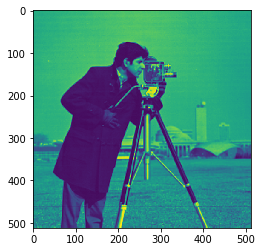

In [5]:
plt.imshow(skimage.data.camera())
skimage.data.camera().shape

(512, 512, 3)

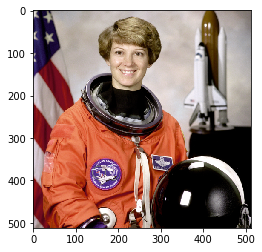

In [6]:
plt.imshow(skimage.data.astronaut())
skimage.data.astronaut().shape

### Set a target image

In [7]:
target_img = skimage.data.astronaut()
n_colors = 3

In [104]:
# target_img = skimage.data.camera()
# n_colors = 1

# Experiments

For the image fitting and poisson experiments, we'll use the classic cameraman image.

In [8]:
def get_cameraman_tensor(sidelength):
    img = Image.fromarray(skimage.data.camera())        
    transform = Compose([
        Resize(sidelength),
        ToTensor(),
        Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])
    img = transform(img)
    return img

In [9]:
def get_target_tensor(sidelength):
    img = Image.fromarray(target_img)        
    transform = Compose([
        Resize(sidelength),
        ToTensor(),
        Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])
    img = transform(img)
    return img

<a id='section_1'></a>
## Fitting an image

First, let's simply fit that image!

We seek to parameterize a greyscale image $f(x)$ with pixel coordinates $x$ with a SIREN $\Phi(x)$.

That is we seek the function $\Phi$ such that:
$\mathcal{L}=\int_{\Omega} \lVert \Phi(\mathbf{x}) - f(\mathbf{x}) \rVert\mathrm{d}\mathbf{x}$
 is minimized, in which $\Omega$ is the domain of the image. 
 
We write a little datast that does nothing except calculating per-pixel coordinates:

In [10]:
class ImageFitting(Dataset):
    def __init__(self, sidelength):
        super().__init__()
        img = get_target_tensor(sidelength)
#         self.pixels = img.permute(1, 2, 0).view(-1, 1)
        self.pixels = img.permute(1,2,0).reshape(-1,n_colors)
        self.coords = get_mgrid(sidelength, 2)

    def __len__(self):
        return 1

    def __getitem__(self, idx):    
        if idx > 0: raise IndexError
            
        return self.coords, self.pixels

Let's instantiate the dataset and our Siren. As pixel coordinates are 2D, the siren has 2 input features, and since the image is grayscale, it has one output channel.

In [11]:
resol = 256

target = ImageFitting(resol)
dataloader = DataLoader(target, batch_size=1, pin_memory=True, num_workers=0)


## Design Model 

In [12]:
img_siren = Siren(in_features=2, out_features=n_colors, hidden_features=80, 
                  hidden_layers=3, outermost_linear=True)
img_siren.cuda()

Siren(
  (net): Sequential(
    (0): SineLayer(
      (linear): Linear(in_features=2, out_features=80, bias=True)
    )
    (1): SineLayer(
      (linear): Linear(in_features=80, out_features=80, bias=True)
    )
    (2): SineLayer(
      (linear): Linear(in_features=80, out_features=80, bias=True)
    )
    (3): SineLayer(
      (linear): Linear(in_features=80, out_features=80, bias=True)
    )
    (4): Linear(in_features=80, out_features=3, bias=True)
  )
)

In [13]:
def count_parameters(model):
    n_param = 0
    for p in model.parameters():
        n_param += p.numel()
    return n_param

count_parameters(img_siren)

19923

We now fit Siren in a simple training loop. Within only hundreds of iterations, the image and its gradients are approximated well.

In [14]:
model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

In [15]:
ground_truth.shape

torch.Size([1, 65536, 3])

Step 0, Total loss 0.414191


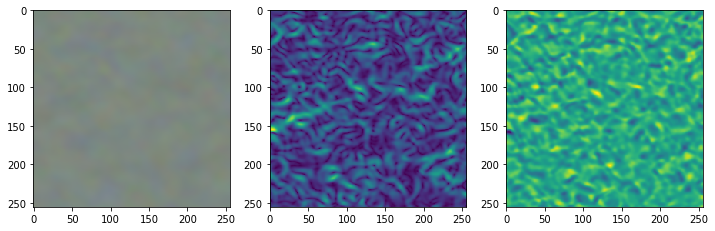

Step 40, Total loss 0.184978


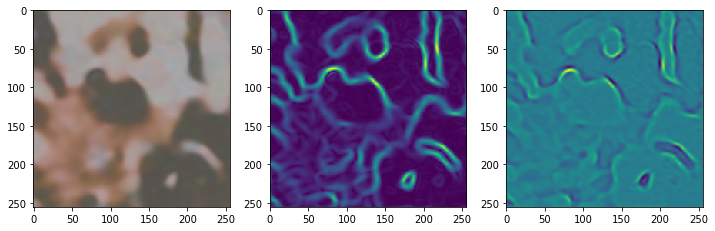

Step 80, Total loss 0.074245


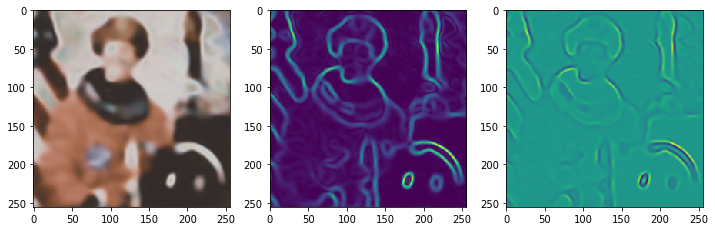

Step 120, Total loss 0.041195


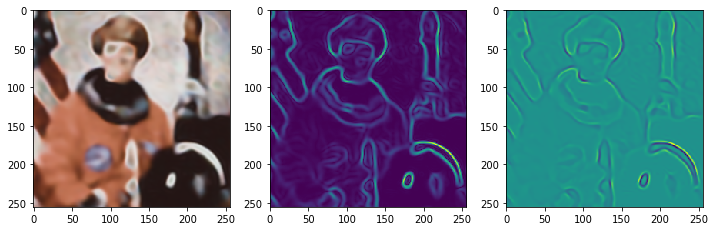

Step 160, Total loss 0.026648


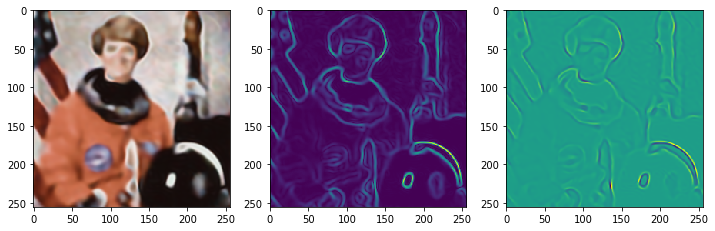

Step 200, Total loss 0.019027


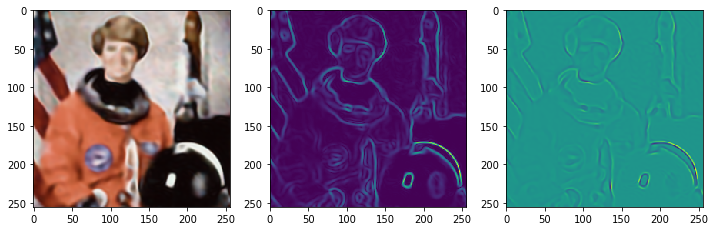

Step 240, Total loss 0.014602


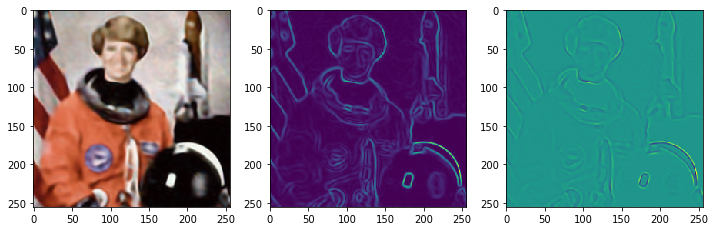

Step 280, Total loss 0.011740


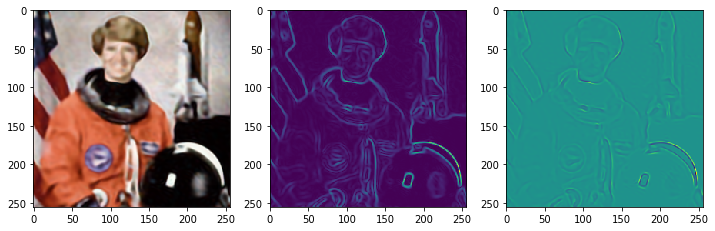

Step 320, Total loss 0.009898


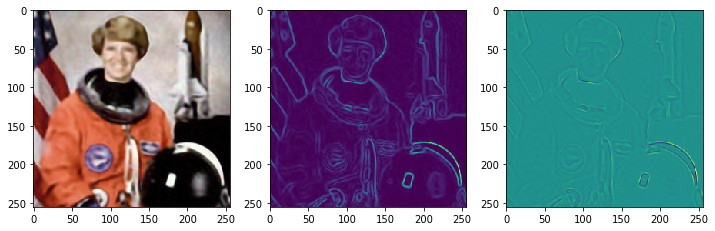

Step 360, Total loss 0.008658


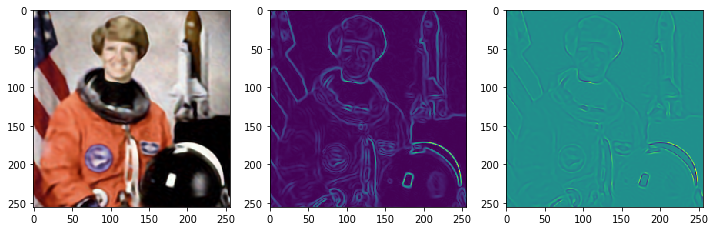

Step 400, Total loss 0.007722


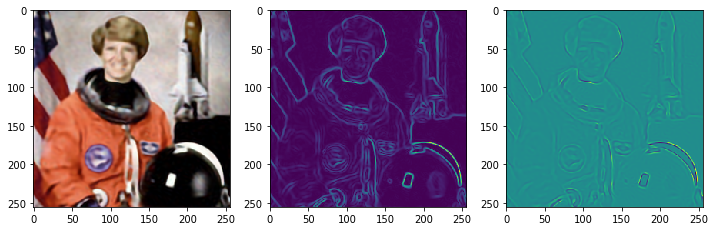

Step 440, Total loss 0.006964


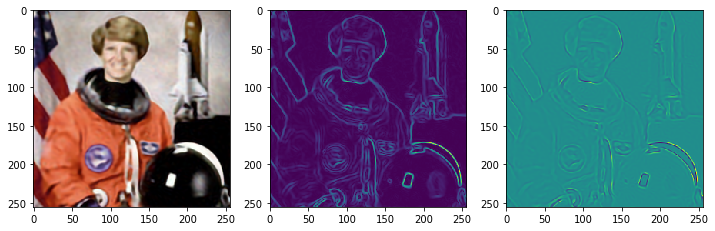

Step 480, Total loss 0.006374


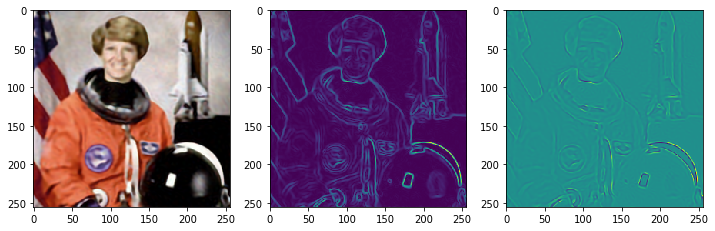

Step 520, Total loss 0.005844


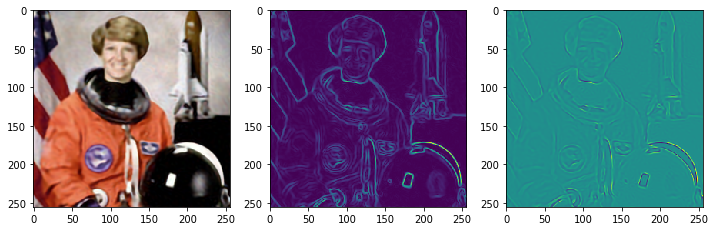

Step 560, Total loss 0.005422


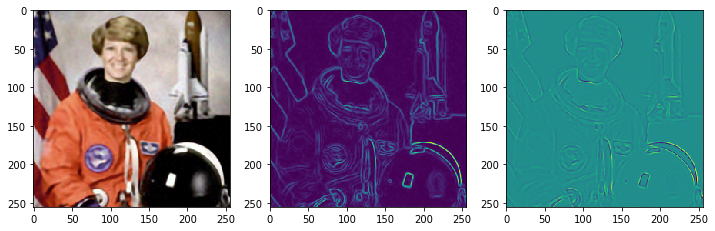

Step 600, Total loss 0.005074


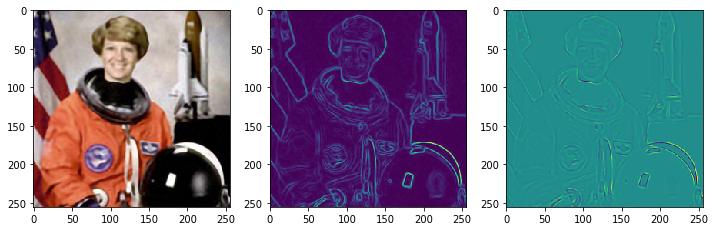

Step 640, Total loss 0.004762


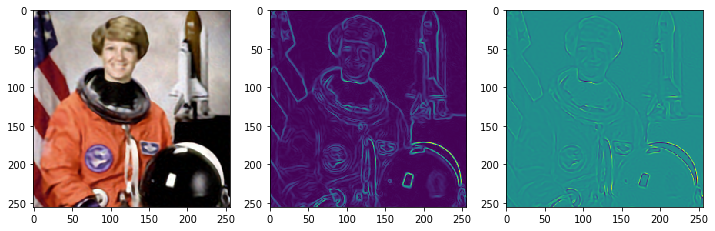

Step 680, Total loss 0.004486


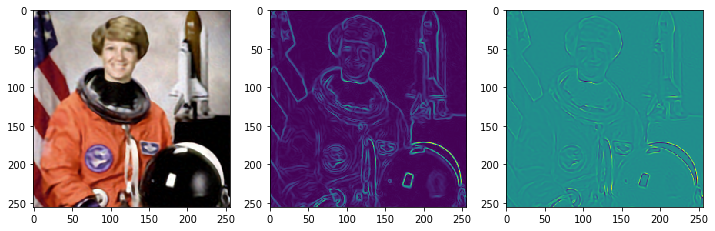

Step 720, Total loss 0.004257


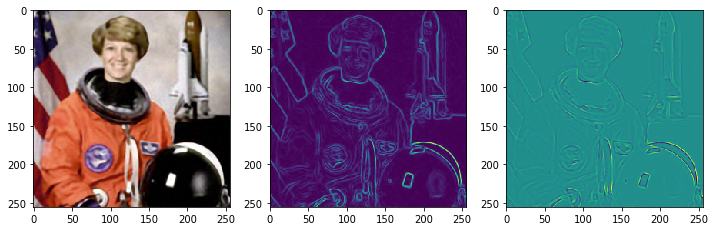

Step 760, Total loss 0.004025


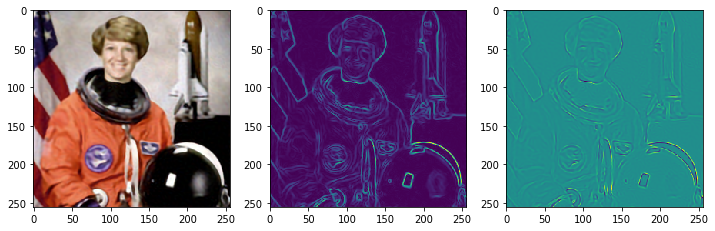

In [16]:
total_steps = 800
steps_til_summary = 40

optim = torch.optim.Adam(lr=1e-4, params=img_siren.parameters())

for step in range(total_steps):
    model_output, coords = img_siren(model_input)    
    
    loss = ((model_output - ground_truth)**2).mean()
    
    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f" % (step, loss))
        img_grad = gradient(model_output, coords)
        img_laplacian = laplace(model_output, coords)

        fig, axes = plt.subplots(1,3, figsize=(12,4))
        output2show = model_output.cpu()
        
        if n_colors == 1:
            output2show = output2show.view(resol,resol).detach().numpy()
        elif n_colors == 3:
            output2show = output2show.view(resol,resol,3).detach().numpy()
        else:
            print("'n_colors' is set with an inacceptible value.")
            break
        output2show = (np.clip(output2show, -1, 1)+1)/2

        axes[0].imshow(output2show)
        axes[1].imshow(img_grad.norm(dim=-1).cpu().view(resol,resol).detach().numpy())
        axes[2].imshow(img_laplacian.cpu().view(resol,resol).detach().numpy())
        plt.show()

    optim.zero_grad()
    loss.backward()
    optim.step()
    torch.cuda.empty_cache()

# Comparison

'''torch.autograd.grad는 자동으로 output에 대한 gradient를 합해준다'''

In [17]:
# import scipy.ndimage
# from skimage.color import rgb2gray

# sidelength = 256

# img = get_target_tensor(sidelength)

# print(img.shape)
# grayscale = rgb2gray(img.permute(1,2,0))
        
# # Compute gradient and laplacian       
# grads_x = scipy.ndimage.sobel(grayscale, axis=0)[..., None]
# grads_y = scipy.ndimage.sobel(grayscale, axis=1)[..., None]
# grads_x, grads_y = torch.from_numpy(grads_x), torch.from_numpy(grads_y)

# gt = torch.stack((grads_x, grads_y), dim=-1).view(-1, 2)

In [18]:
# def sobel4color(img=get_target_tensor(256)):
#     grayscale = rgb2gray(img.permute(1,2,0))
        
#     # Compute gradient and laplacian       
#     grads_x = scipy.ndimage.sobel(grayscale, axis=0)[..., None]
#     grads_y = scipy.ndimage.sobel(grayscale, axis=1)[..., None]
#     grads_x, grads_y = torch.from_numpy(grads_x), torch.from_numpy(grads_y)

#     gt = torch.stack((grads_x, grads_y), dim=-1).view(-1, 2)
#     return gt

In [19]:
def grad4gray(img):     
    grads_x = scipy.ndimage.sobel(img, axis=1).squeeze(0)[..., None]
    grads_y = scipy.ndimage.sobel(img, axis=2).squeeze(0)[..., None]
    grads_x, grads_y = torch.from_numpy(grads_x), torch.from_numpy(grads_y)

    return torch.stack((grads_x, grads_y), dim=-1).view(-1, 2)

In [20]:
'''3차원 grad 반환'''
def grad4color(img):
    grad_list = []
    for i in range(3):
        img_c = np.expand_dims(img[i,:,:], 0)
#             print(img_c.shape)
        grads_x = scipy.ndimage.sobel(img_c, axis=1).squeeze(0)[..., None]
        grads_y = scipy.ndimage.sobel(img_c, axis=2).squeeze(0)[..., None]
        grads_x, grads_y = torch.from_numpy(grads_x), torch.from_numpy(grads_y)
        grad_list.append(torch.stack((grads_x, grads_y), dim=-1).view(-1, 2))
    return torch.stack(grad_list, dim=0)


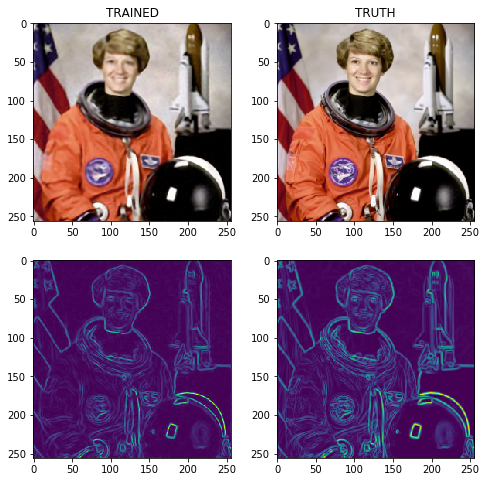

In [21]:
import scipy.ndimage

img_siren.eval()

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

original = ground_truth[0].cpu().detach().numpy()
model_output, coords = img_siren(model_input)
output2show = model_output.cpu()

fig, axes = plt.subplots(2, 2, figsize=(8, 8))


'''Image'''

if n_colors == 1:
    original  = original.reshape(resol,resol)
    output2show = output2show.view(resol,resol).detach().numpy()
elif n_colors == 3:
    original = original.reshape(resol,resol,3)
    output2show = output2show.view(resol,resol,3).detach().numpy()
else:
    print("'n_colors' is set with an inacceptible value.")

output2show = (np.clip(output2show, -1, 1)+1)/2
original = (np.clip(original, -1, 1)+1)/2

axes[0,0].imshow(output2show)
axes[0,1].imshow(original)


'''Gradient'''


if n_colors == 1:
    gt = grad4gray(np.expand_dims(original,0))
elif n_colors == 3:
    gt = grad4color(np.transpose(original, (2,0,1)))
    gt = torch.sum(gt, dim=0)
else:
    print("'n_colors' is set with an inacceptible value.")
    
# gt = sobel4color(get_target_tensor(256))
gt = gt.cpu().norm(dim=-1).view(resol,resol).detach().numpy()

img_grad = gradient(model_output, coords)

axes[1,0].imshow(img_grad.cpu().norm(dim=-1).view(resol,resol).detach().numpy())
axes[1,1].imshow(gt)

axes[0, 0].set_title("TRAINED")
axes[0, 1].set_title("TRUTH")


plt.show()

# High Resolution

In [22]:
# img_siren.eval()

# resol = 512

# target = ImageFitting(resol)
# original = target.pixels
# model_input = target.coords

# model_output, coords = img_siren(model_input.cuda())
# fig, axes = plt.subplots(1, 2, figsize=(8, 4))

# output_img = model_output.cpu().view(resol, resol,3).detach().numpy()
# output_img = (np.clip(output_img, -1, 1)+1)/2

# original = (np.clip(original, -1, 1)+1)/2

# axes[0].imshow(output_img)
# axes[1].imshow(original.view(resol,resol,3))

# plt.show()

# gt = sobel4color(get_target_tensor(resol))

# img_grad = gradient(model_output, coords)

# fig, axes = plt.subplots(1, 2, figsize=(8, 4))

# axes[0].imshow(img_grad.cpu().norm(dim=-1).view(resol,resol).detach().numpy())
# axes[1].imshow(gt.cpu().norm(dim=-1).view(resol,resol).detach().numpy())

# plt.show()

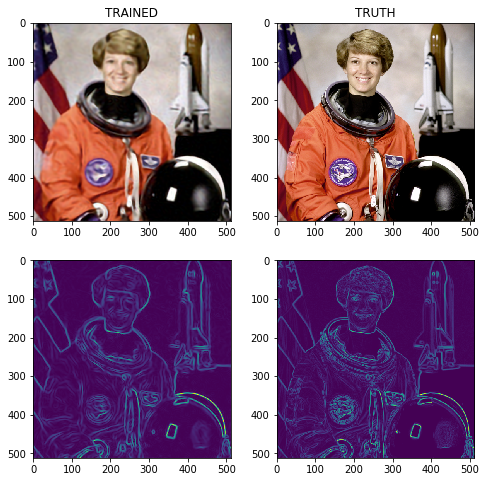

In [23]:
img_siren.eval()

h_resol = 512

target = ImageFitting(h_resol)
original = target.pixels
model_input = target.coords

model_output, coords = img_siren(model_input.cuda())
output2show = model_output.cpu()

fig, axes = plt.subplots(2, 2, figsize=(8, 8))


'''Image'''

if n_colors == 1:
    original  = original.reshape(h_resol,h_resol)
    output2show = output2show.view(h_resol,h_resol).detach().numpy()
elif n_colors == 3:
    original = original.reshape(h_resol,h_resol,3)
    output2show = output2show.view(h_resol,h_resol,3).detach().numpy()
else:
    print("'n_colors' is set with an inacceptible value.")

output2show = (np.clip(output2show, -1, 1)+1)/2
original = (np.clip(original, -1, 1)+1)/2

axes[0,0].imshow(output2show)
axes[0,1].imshow(original)

'''Gradient'''

if n_colors == 1:
    gt = grad4gray(np.expand_dims(original,0))
elif n_colors == 3:
    gt = grad4color(np.transpose(original, (2,0,1)))
    gt = torch.sum(gt, dim=0)
else:
    print("'n_colors' is set with an inacceptible value.")
    
# gt = sobel4color(get_target_tensor(256))
gt = gt.cpu().norm(dim=-1).view(h_resol,h_resol).detach().numpy()

img_grad = gradient(model_output, coords)

axes[1,0].imshow(img_grad.cpu().norm(dim=-1).view(h_resol,h_resol).detach().numpy())
axes[1,1].imshow(gt)

axes[0, 0].set_title("TRAINED")
axes[0, 1].set_title("TRUTH")


plt.show()

---

여기부터 OOD는 무시해도 무방.

In [49]:
del img_grad
del img_laplacian
torch.cuda.empty_cache()

In [51]:
model_input.shape

torch.Size([1, 65536, 2])

In [63]:
# def get_mgrid(sidelen, dim=2):
#     '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
#     sidelen: int
#     dim: int'''
#     tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])
#     mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
#     mgrid = mgrid.reshape(-1, dim)
#     return mgrid

# get_mgrid(256, 2)

n_pix = 512

tensors = tuple(2 * [torch.linspace(-2, 2, steps=n_pix)])
mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
mgrid = mgrid.reshape(-1, 2).cuda()
# mgrid
model_output, coords = img_siren(mgrid)

print(coords.shape)

torch.Size([262144, 2])


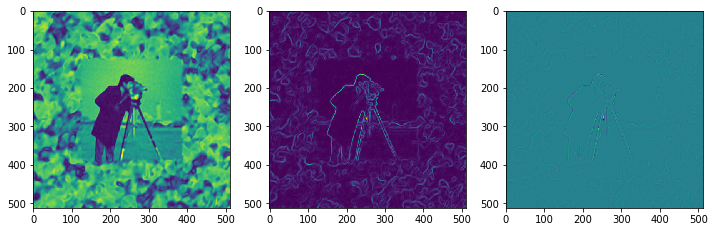

In [64]:
img_grad = gradient(model_output, coords)
img_laplacian = laplace(model_output, coords)

fig, axes = plt.subplots(1,3, figsize=(12,4))
axes[0].imshow(model_output.cpu().view(n_pix, n_pix).detach().numpy())
axes[1].imshow(img_grad.norm(dim=-1).cpu().view(n_pix, n_pix).detach().numpy())
axes[2].imshow(img_laplacian.cpu().view(n_pix, n_pix).detach().numpy())
plt.show()

# OOD Analysis

In [69]:
img_siren = Siren(in_features=2, out_features=1, hidden_features=50, 
                  hidden_layers=3, outermost_linear=True)
img_siren.cuda()

Siren(
  (net): Sequential(
    (0): SineLayer(
      (linear): Linear(in_features=2, out_features=50, bias=True)
    )
    (1): SineLayer(
      (linear): Linear(in_features=50, out_features=50, bias=True)
    )
    (2): SineLayer(
      (linear): Linear(in_features=50, out_features=50, bias=True)
    )
    (3): SineLayer(
      (linear): Linear(in_features=50, out_features=50, bias=True)
    )
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)

In [70]:
model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

Step 0, Total loss 0.228168


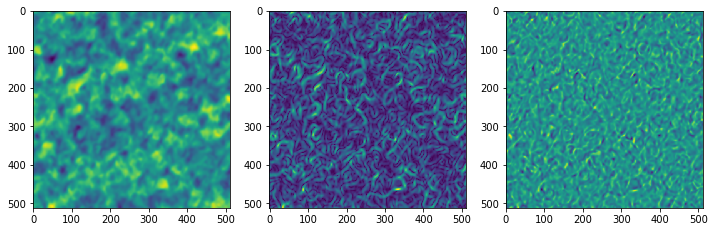

Step 40, Total loss 0.075994


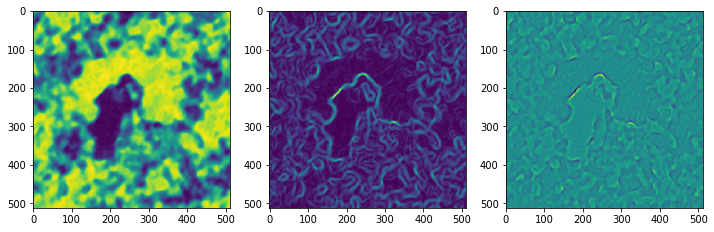

Step 80, Total loss 0.033724


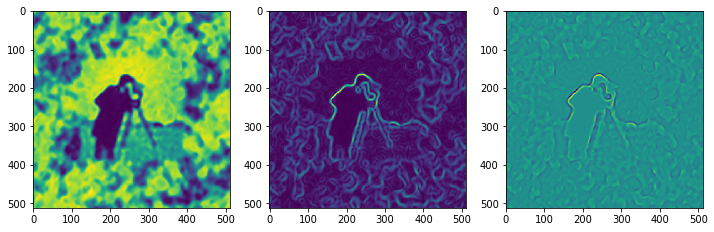

Step 120, Total loss 0.021304


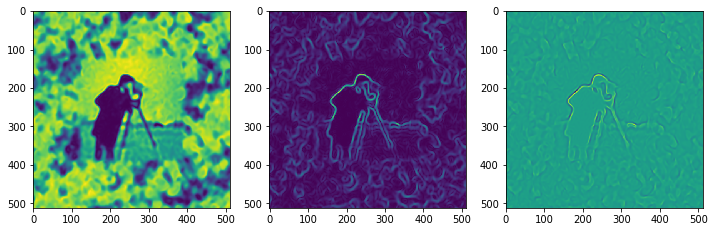

Step 160, Total loss 0.016528


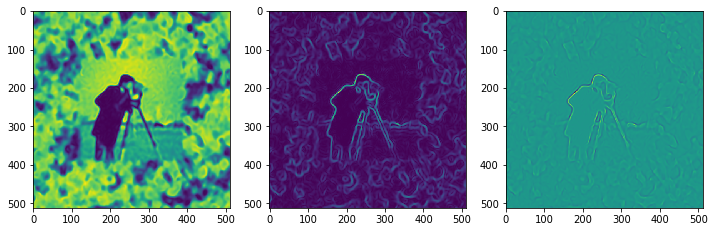

Step 200, Total loss 0.014006


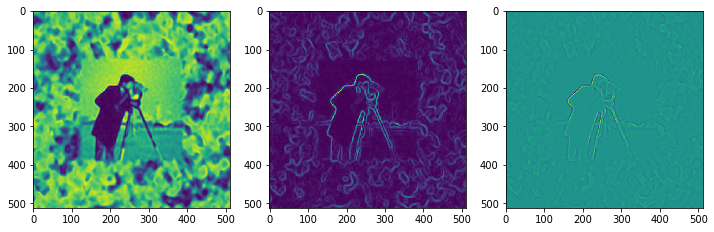

Step 240, Total loss 0.012287


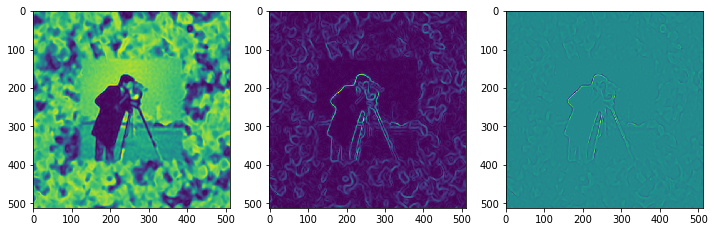

Step 280, Total loss 0.010890


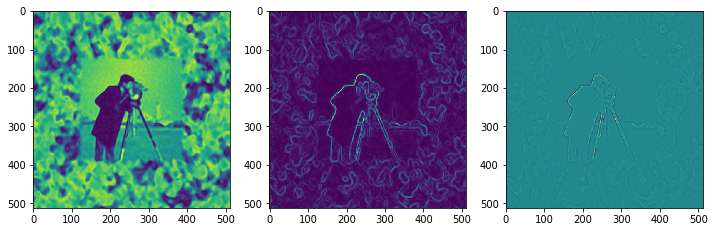

Step 320, Total loss 0.009646


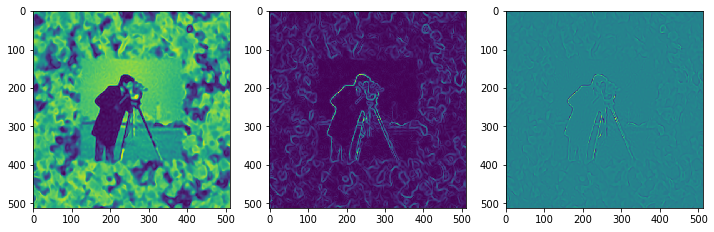

Step 360, Total loss 0.008623


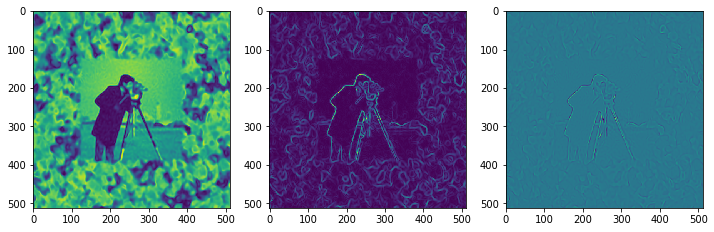

In [71]:
total_steps = 400 # Since the whole image is our dataset, this just means 500 gradient descent steps.
steps_til_summary = 40

optim = torch.optim.Adam(lr=1e-4, params=img_siren.parameters())

for step in range(total_steps):
    model_output, coords = img_siren(model_input)    
    loss = ((model_output - ground_truth)**2).mean()

    optim.zero_grad()
    loss.backward()
    optim.step()
    
#     with torch.no_grad():
    if not step % steps_til_summary:
        model_output, coords = img_siren(mgrid) 
        print("Step %d, Total loss %0.6f" % (step, loss))
        img_grad = gradient(model_output, coords)
        img_laplacian = laplace(model_output, coords)

        fig, axes = plt.subplots(1,3, figsize=(12,4))
        axes[0].imshow(model_output.cpu().view(n_pix, n_pix).detach().numpy())
        axes[1].imshow(img_grad.norm(dim=-1).cpu().view(n_pix, n_pix).detach().numpy())
        axes[2].imshow(img_laplacian.cpu().view(n_pix, n_pix).detach().numpy())
        plt.show()
    
    
    torch.cuda.empty_cache()

<a id='section_3'></a>
# Solving Poisson's equation

Now, let's make it a bit harder. Let's say we want to reconstruct an image but we only have access to its gradients!

That is, we now seek the function $\Phi$ such that:
$\mathcal{L}=\int_{\Omega} \lVert \nabla\Phi(\mathbf{x}) - \nabla f(\mathbf{x}) \rVert\mathrm{d}\mathbf{x}$
 is minimized, in which $\Omega$ is the domain of the image. 

In [24]:
import scipy.ndimage
    
class PoissonEqn(Dataset):
    def __init__(self, sidelength):
        super().__init__()
        img = get_cameraman_tensor(sidelength)
        
        # Compute gradient and laplacian       
        grads_x = scipy.ndimage.sobel(img.numpy(), axis=1).squeeze(0)[..., None]
        grads_y = scipy.ndimage.sobel(img.numpy(), axis=2).squeeze(0)[..., None]
        grads_x, grads_y = torch.from_numpy(grads_x), torch.from_numpy(grads_y)
                
        self.grads = torch.stack((grads_x, grads_y), dim=-1).view(-1, 2)
        self.laplace = scipy.ndimage.laplace(img.numpy()).squeeze(0)[..., None]
        self.laplace = torch.from_numpy(self.laplace)
        
        self.pixels = img.permute(1, 2, 0).view(-1, 1)
        self.coords = get_mgrid(sidelength, 2)

    def __len__(self):
        return 1

    def __getitem__(self, idx):
        return self.coords, {'pixels':self.pixels, 'grads':self.grads, 'laplace':self.laplace}

In [25]:
class target_PoissonEqn(Dataset):
    def __init__(self, sidelength):
        super().__init__()
        img = get_target_tensor(sidelength)

        if n_colors == 1:
            gt = grad4gray(img)
        elif n_colors == 3:
            gt = grad4color(img)
        else:
            print("'n_colors' is set with an inacceptible value.")
        self.grads = gt

        
        self.laplace = 0
#         self.laplace = scipy.ndimage.laplace(img.numpy()).squeeze(0)[..., None]
#         self.laplace = torch.from_numpy(self.laplace)
        
        self.pixels = img.permute(1, 2, 0).view(-1, n_colors)
        self.coords = get_mgrid(sidelength, 2)

    def __len__(self):
        return 1

    def __getitem__(self, idx):
        return self.coords, {'pixels':self.pixels, 'grads':self.grads, 'laplace':self.laplace}

#### Instantiate SIREN model

In [26]:
resol = 256

In [27]:
target_poisson = target_PoissonEqn(resol)
dataloader = DataLoader(target_poisson, batch_size=1, pin_memory=True, num_workers=0)

poisson_siren = Siren(in_features=2, out_features=n_colors, hidden_features=80, 
                      hidden_layers=3, outermost_linear=True)
poisson_siren.cuda()

Siren(
  (net): Sequential(
    (0): SineLayer(
      (linear): Linear(in_features=2, out_features=80, bias=True)
    )
    (1): SineLayer(
      (linear): Linear(in_features=80, out_features=80, bias=True)
    )
    (2): SineLayer(
      (linear): Linear(in_features=80, out_features=80, bias=True)
    )
    (3): SineLayer(
      (linear): Linear(in_features=80, out_features=80, bias=True)
    )
    (4): Linear(in_features=80, out_features=3, bias=True)
  )
)

#### Define the loss function

In [28]:
def grad_mse(model_output, coords, gt_gradients):
    
    if n_colors==1:
        # compute gradients on the model
        gradients = gradient(model_output, coords)
        # compare them with the ground-truth
        gradients_loss = torch.mean((gradients - gt_gradients).pow(2).sum(-1))
        return gradients_loss
    
    elif n_colors==3:
        y = model_output
        x = coords
        loss = 0
        for i in range(3):
            yi = y[:,:,i]
            gradients = torch.autograd.grad(yi, [x], grad_outputs=torch.ones_like(yi), create_graph=True)[0]
            loss += torch.mean((gradients - gt_gradients[:,i,:]).pow(2).sum(-1))
        return loss
        
    else: 
        print("'n_colors' is set with an inacceptible value.")
        return None
        

#### Train the model

Step 0, Total loss 72.551437, iteration time 0.052209


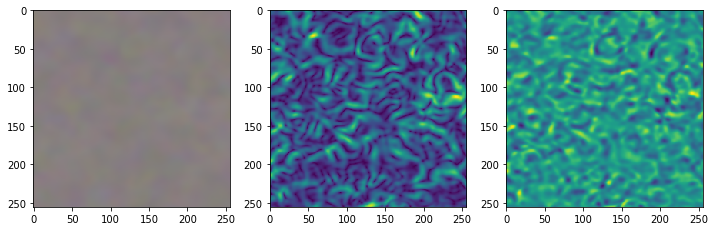

Step 40, Total loss 36.089344, iteration time 0.028396


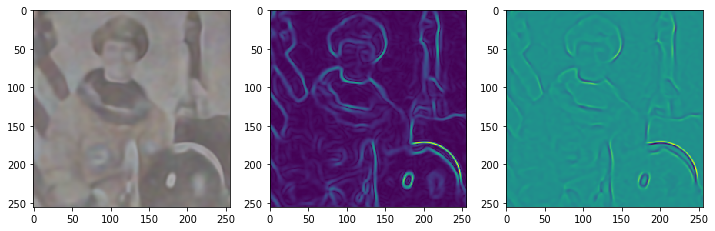

Step 80, Total loss 16.281227, iteration time 0.028996


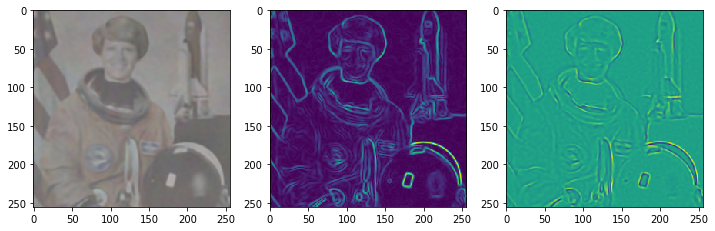

Step 120, Total loss 8.393535, iteration time 0.036418


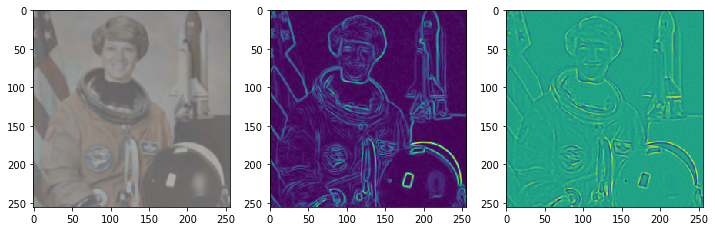

Step 160, Total loss 5.509567, iteration time 0.043257


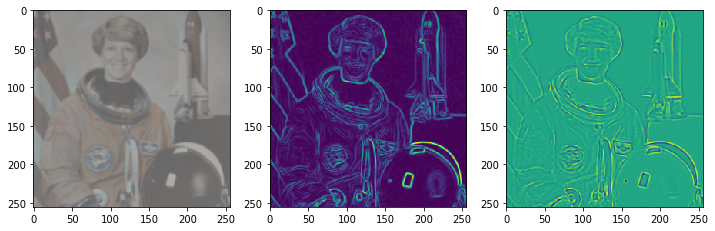

Step 200, Total loss 4.291491, iteration time 0.065077


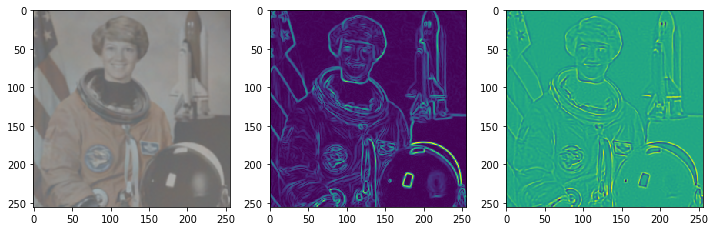

Step 240, Total loss 3.611788, iteration time 0.031706


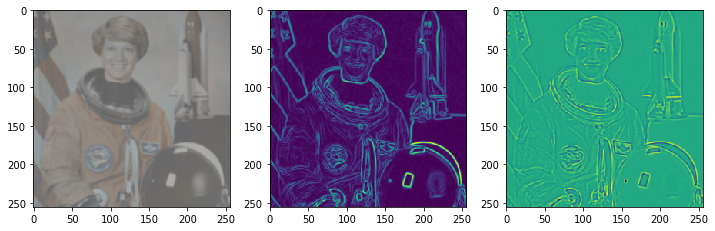

Step 280, Total loss 3.192441, iteration time 0.079418


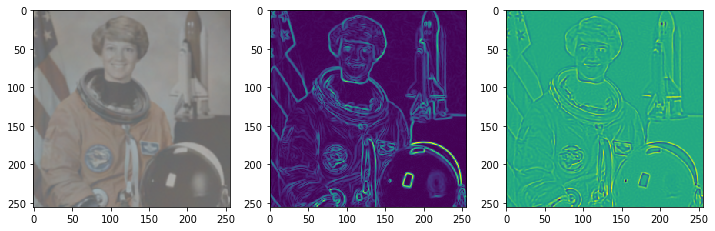

Step 320, Total loss 2.897624, iteration time 0.030138


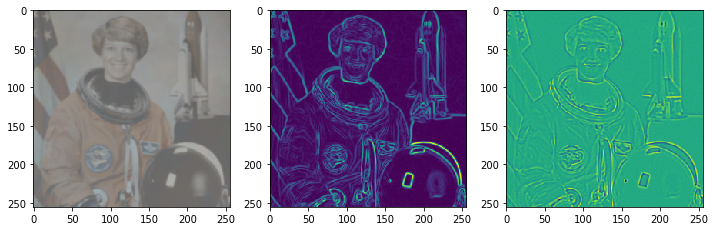

Step 360, Total loss 2.697347, iteration time 0.029626


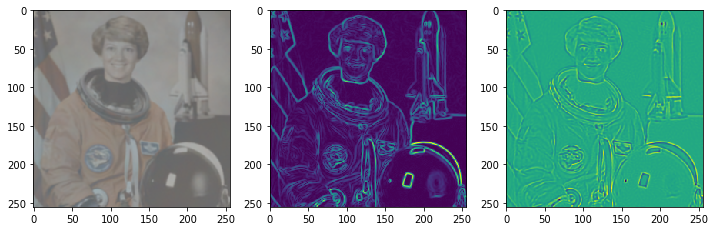

Step 400, Total loss 2.542398, iteration time 0.029251


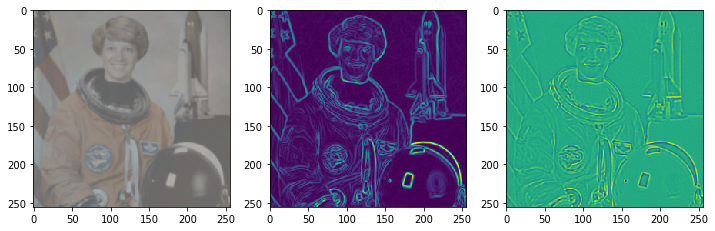

Step 440, Total loss 2.412967, iteration time 0.038620


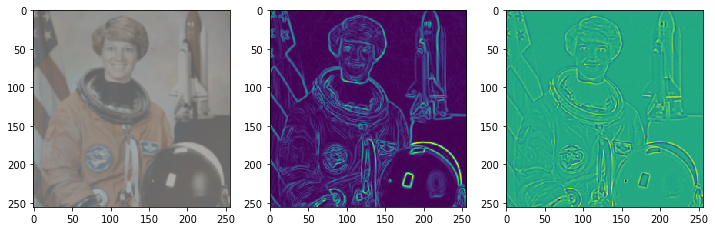

Step 480, Total loss 2.303256, iteration time 0.031735


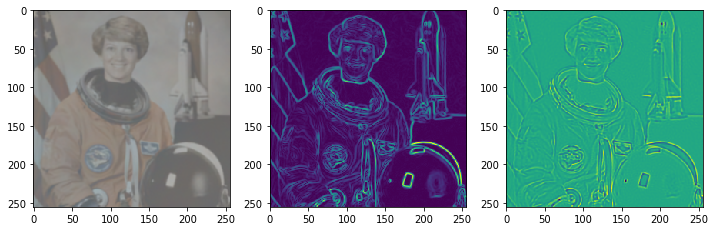

Step 520, Total loss 2.209891, iteration time 0.030878


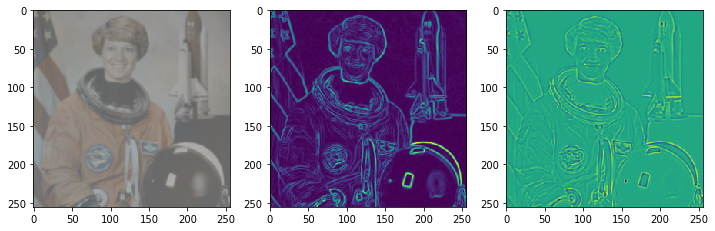

Step 560, Total loss 2.141987, iteration time 0.032213


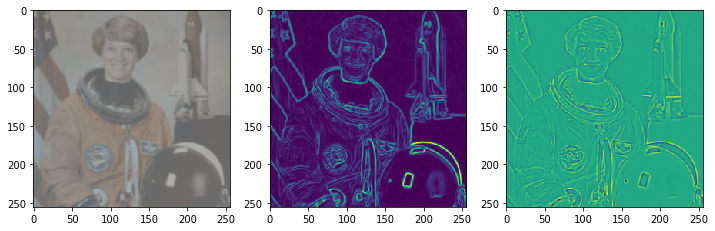

Step 600, Total loss 2.146052, iteration time 0.029493


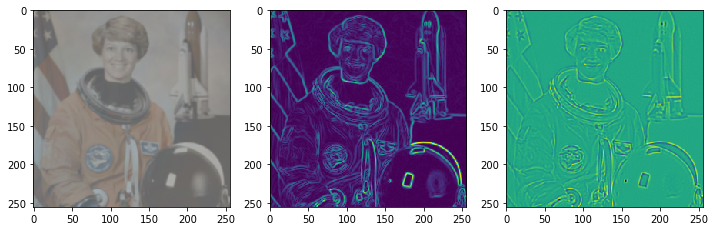

Step 640, Total loss 2.013326, iteration time 0.052772


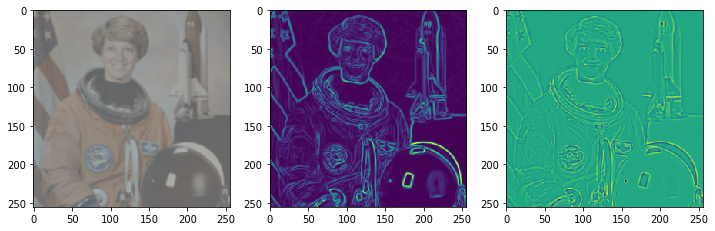

Step 680, Total loss 1.965463, iteration time 0.016752


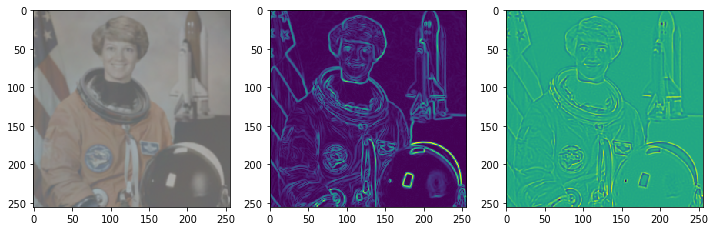

Step 720, Total loss 1.958664, iteration time 0.029037


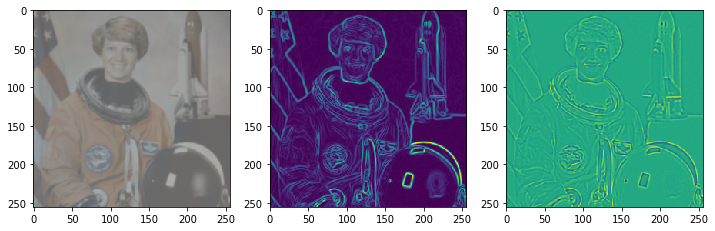

Step 760, Total loss 1.903654, iteration time 0.031543


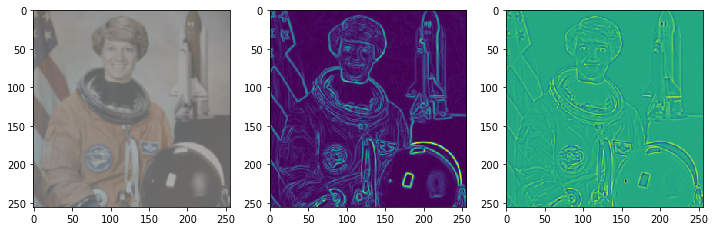

In [ ]:


total_steps = 800
steps_til_summary = 40

optim = torch.optim.Adam(lr=1e-4, params=poisson_siren.parameters())

model_input, gt = next(iter(dataloader))
gt = {key: value.cuda() for key, value in gt.items()}
model_input = model_input.cuda()

for step in range(total_steps):
    start_time = time.time()

    model_output, coords = poisson_siren(model_input)
    train_loss = grad_mse(model_output, coords, gt['grads'])

    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f, iteration time %0.6f" % (step, train_loss, time.time() - start_time))

        img_grad = gradient(model_output, coords)
        img_laplacian = laplace(model_output, coords)
        
        fig, axes = plt.subplots(1, 3, figsize=(12, 4))
        
        output2show = model_output.cpu()
        
        if n_colors == 1:
            output2show = output2show.view(resol,resol).detach().numpy()
        elif n_colors == 3:
            output2show = output2show.view(resol,resol,3).detach().numpy()
        else:
            print("'n_colors' is set with an inacceptible value.")
            break
        output2show = (np.clip(output2show, -1, 1)+1)/2

        axes[0].imshow(output2show)
        axes[1].imshow(img_grad.cpu().norm(dim=-1).view(resol,resol).detach().numpy())
        axes[2].imshow(img_laplacian.cpu().view(resol,resol).detach().numpy())
        plt.show()
        
    optim.zero_grad()
    train_loss.backward()
    optim.step()
    torch.cuda.empty_cache()

## Comparison

In [ ]:
model_input, gt = next(iter(dataloader))
gt = {key: value.cuda() for key, value in gt.items()}
model_input = model_input.cuda()

poisson_siren.eval()

model_output, coords = poisson_siren(model_input)

target = ImageFitting(resol)
original = target.pixels

model_output, coords = img_siren(model_input)
output2show = model_output.cpu()

fig, axes = plt.subplots(2, 2, figsize=(8, 8))


'''Image'''

if n_colors == 1:
    original  = original.reshape(resol,resol)
    output2show = output2show.view(resol,resol).detach().numpy()
elif n_colors == 3:
    original = original.reshape(resol,resol,3)
    output2show = output2show.view(resol,resol,3).detach().numpy()
else:
    print("'n_colors' is set with an inacceptible value.")

output2show = (np.clip(output2show, -1, 1)+1)/2
original = (np.clip(original, -1, 1)+1)/2

axes[0,0].imshow(output2show)
axes[0,1].imshow(original)


'''Gradient'''


if n_colors == 1:
    gt = grad4gray(np.expand_dims(original,0))
elif n_colors == 3:
    gt = grad4color(np.transpose(original, (2,0,1)))
    gt = torch.sum(gt, dim=0)
else:
    print("'n_colors' is set with an inacceptible value.")
    
# gt = sobel4color(get_target_tensor(256))
gt = gt.cpu().norm(dim=-1).view(resol,resol).detach().numpy()

img_grad = gradient(model_output, coords)

axes[1,0].imshow(img_grad.cpu().norm(dim=-1).view(resol,resol).detach().numpy())
axes[1,1].imshow(gt)

axes[0, 0].set_title("TRAINED")
axes[0, 1].set_title("TRUTH")


plt.show()

---

'''gradient sum에 대해서 최적화 하는게 문제인듯'''

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


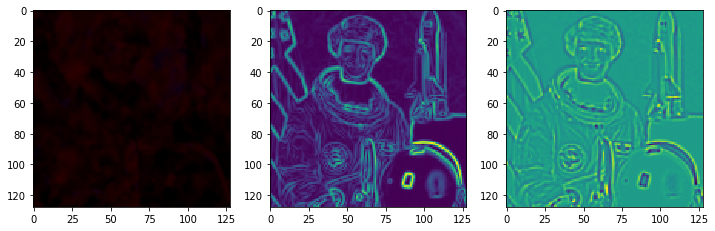

In [159]:
output_img = model_output.cpu().view(resol, resol,3).detach().numpy()
# output_img = (np.clip(output_img, -1, 1)+1)/2    

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(output_img)
axes[1].imshow(img_grad.cpu().norm(dim=-1).view(128,128).detach().numpy())
axes[2].imshow(img_laplacian.cpu().view(128,128).detach().numpy())
plt.show()

In [90]:
model_input.shape

torch.Size([1, 16384, 2])

In [91]:
cameraman = ImageFitting(128)
original = cameraman.pixels

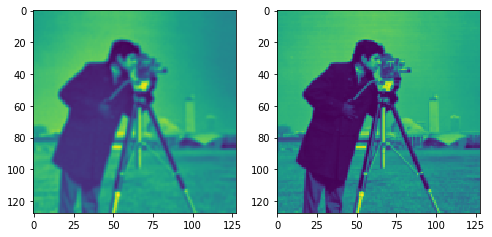

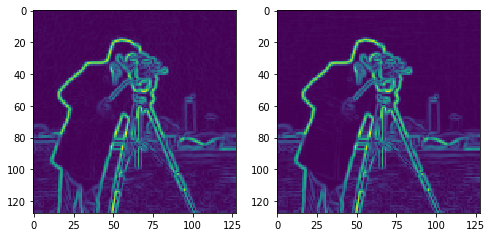

In [94]:
poisson_siren.eval()

model_output, coords = poisson_siren(model_input)
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(model_output.cpu().view(128,128).detach().numpy())
axes[1].imshow(original.view(128,128))
# axes[1].imshow(img_grad.cpu().norm(dim=-1).view(128,128).detach().numpy())
# axes[2].imshow(img_laplacian.cpu().view(128,128).detach().numpy())
plt.show()

img_grad = gradient(model_output, coords)

fig, axes = plt.subplots(1, 2, figsize=(8, 4))
# axes[0].imshow(model_output.cpu().view(128,128).detach().numpy())
# axes[1].imshow(original.view(128,128))
axes[0].imshow(img_grad.cpu().norm(dim=-1).view(128,128).detach().numpy())
axes[1].imshow(gt['grads'].cpu().norm(dim=-1).view(128,128).detach().numpy())
# axes[2].imshow(img_laplacian.cpu().view(128,128).detach().numpy())
plt.show()



# train_loss = gradients_mse(model_output, coords, gt['grads'])

# if not step % steps_til_summary:
#     print("Step %d, Total loss %0.6f, iteration time %0.6f" % (step, train_loss, time.time() - start_time))

#     img_grad = gradient(model_output, coords)
#     img_laplacian = laplace(model_output, coords)

#     fig, axes = plt.subplots(1, 3, figsize=(12, 4))
#     axes[0].imshow(model_output.cpu().view(128,128).detach().numpy())
#     axes[1].imshow(img_grad.cpu().norm(dim=-1).view(128,128).detach().numpy())
#     axes[2].imshow(img_laplacian.cpu().view(128,128).detach().numpy())
#     plt.show()

<a id='activations'></a>
## Initialization scheme & distribution of activations

We now reproduce the empirical result on the distribution of activations, and will thereafter show empirically that the distribution of activations is shift-invariant as well! 

In [ ]:
from collections import OrderedDict
import matplotlib
import numpy.fft as fft
import scipy.stats as stats


def eformat(f, prec, exp_digits):
    s = "%.*e"%(prec, f)
    mantissa, exp = s.split('e')
    # add 1 to digits as 1 is taken by sign +/-
    return "%se%+0*d"%(mantissa, exp_digits+1, int(exp))

def format_x_ticks(x, pos):
    """Format odd tick positions
    """
    return eformat(x, 0, 1)

def format_y_ticks(x, pos):
    """Format odd tick positions
    """
    return eformat(x, 0, 1)

def get_spectrum(activations):
    n = activations.shape[0]

    spectrum = fft.fft(activations.numpy().astype(np.double).sum(axis=-1), axis=0)[:n//2]
    spectrum = np.abs(spectrum)

    max_freq = 100                
    freq = fft.fftfreq(n, 2./n)[:n//2]
    return freq[:max_freq], spectrum[:max_freq]


def plot_all_activations_and_grads(activations):
    num_cols = 4
    num_rows = len(activations)
    
    fig_width = 5.5
    fig_height = num_rows/num_cols*fig_width
    fig_height = 9
    
    fontsize = 5
        
    fig, axs = plt.subplots(num_rows, num_cols, gridspec_kw={'hspace': 0.3, 'wspace': 0.2},
                            figsize=(fig_width, fig_height), dpi=300)
    
    axs[0][0].set_title("Activation Distribution", fontsize=7, fontfamily='serif', pad=5.)
    axs[0][1].set_title("Activation Spectrum", fontsize=7, fontfamily='serif', pad=5.)
    axs[0][2].set_title("Gradient Distribution", fontsize=7, fontfamily='serif', pad=5.)
    axs[0][3].set_title("Gradient Spectrum", fontsize=7, fontfamily='serif', pad=5.)

    x_formatter = matplotlib.ticker.FuncFormatter(format_x_ticks)
    y_formatter = matplotlib.ticker.FuncFormatter(format_y_ticks)

    spec_rows = []
    for idx, (key, value) in enumerate(activations.items()):    
        grad_value = value.grad.cpu().detach().squeeze(0)
        flat_grad = grad_value.view(-1)
        axs[idx][2].hist(flat_grad, bins=256, density=True)
        
        value = value.cpu().detach().squeeze(0) # (1, num_points, 256)
        n = value.shape[0]
        flat_value = value.view(-1)
            
        axs[idx][0].hist(flat_value, bins=256, density=True)
                
        if idx>1:
            if not (idx)%2:
                x = np.linspace(-1, 1., 500)
                axs[idx][0].plot(x, stats.arcsine.pdf(x, -1, 2), 
                                 linestyle=':', markersize=0.4, zorder=2)
            else:
                mu = 0
                variance = 1
                sigma = np.sqrt(variance)
                x = np.linspace(mu - 3*sigma, mu + 3*sigma, 500)
                axs[idx][0].plot(x, stats.norm.pdf(x, mu, sigma), 
                                 linestyle=':', markersize=0.4, zorder=2)
        
        activ_freq, activ_spec = get_spectrum(value)
        axs[idx][1].plot(activ_freq, activ_spec)
        
        grad_freq, grad_spec = get_spectrum(grad_value)
        axs[idx][-1].plot(grad_freq, grad_spec)
        
        for ax in axs[idx]:
            ax.tick_params(axis='both', which='major', direction='in',
                                    labelsize=fontsize, pad=1., zorder=10) 
            ax.tick_params(axis='x', labelrotation=0, pad=1.5, zorder=10) 

            ax.xaxis.set_major_formatter(x_formatter)
            ax.yaxis.set_major_formatter(y_formatter)

In [ ]:
model = Siren(in_features=1, hidden_features=2048, 
              hidden_layers=10, out_features=1, outermost_linear=True)

input_signal = torch.linspace(-1, 1, 65536//4).view(1, 65536//4, 1)
activations = model.forward_with_activations(input_signal, retain_grad=True)
output = activations[next(reversed(activations))]

# Compute gradients. Because we have retain_grad=True on 
# activations, each activation stores its own gradient!
output.mean().backward()

plot_all_activations_and_grads(activations)

Note how the activations of Siren always alternate between a standard normal distribution with standard deviation one, and an arcsine distribution. If you have a beefy computer, you can put this to the extreme and increase the number of layers - this property holds even for more than 50 layers!

<a id='shift_invariance'></a>
## Distribution of activations is shift-invariant

One of the key properties of the periodic sine nonlinearity is that it affords a degree of shift-invariance. Consider the first layer of a Siren: You can convince yourself that this layer can easily learn to map two different coordinates to *the same set of activations*. This means that whatever layers come afterwards will apply the same function to these two sets of coordinates.

Moreoever, the distribution of activations similarly are shift-invariant. Let's shift our input signal by 1000 and re-compute the activations:

In [ ]:
input_signal = torch.linspace(-1, 1, 65536//4).view(1, 65536//4, 1) + 1000
activations = model.forward_with_activations(input_signal, retain_grad=True)
output = activations[next(reversed(activations))]

# Compute gradients. Because we have retain_grad=True on 
# activations, each activation stores its own gradient!
output.mean().backward()

plot_all_activations_and_grads(activations)

As we can see, the distributions of activations didn't change at all - they are perfectly invariant to the shift.